In [1]:
#!pip install --user holoviews

https://www.kaggle.com/aremoto/credit-risk-case-study

In [2]:
## Import Libraries

import itertools
import numpy as np
import pandas as pd
import seaborn as sns

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn.metrics import classification_report



from sklearn.ensemble import BaggingClassifier, ExtraTreesClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier


from mlxtend.plotting import plot_learning_curves
from mlxtend.plotting import plot_decision_regions

from sklearn.decomposition import PCA

from pprint import pprint

import holoviews as hv
hv.extension('bokeh', 'matplotlib', logo=False)

# Avoid warnings to show up (trick for the final notebook on kaggle)
import warnings
warnings.filterwarnings('ignore')

In [3]:
hmeq_csv = 'C:/Users/zheng/Desktop/Data Science/Presentations/Mod 8//hmeq.csv'

hmeq = pd.read_csv(hmeq_csv)

hmeq.drop('DEBTINC', axis=1, inplace=True) # The meaning of this variable is not clear. Better drop it for the moment
hmeq.dropna(axis=0, how='any', inplace=True)

hmeq.head()

,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO
0,1,1100,25860.0,39025.0,HomeImp,Other,10.5,0.0,0.0,94.366667,1.0,9.0
1,1,1300,70053.0,68400.0,HomeImp,Other,7.0,0.0,2.0,121.833333,0.0,14.0
2,1,1500,13500.0,16700.0,HomeImp,Other,4.0,0.0,0.0,149.466667,1.0,10.0
4,0,1700,97800.0,112000.0,HomeImp,Office,3.0,0.0,0.0,93.333333,0.0,14.0
5,1,1700,30548.0,40320.0,HomeImp,Other,9.0,0.0,0.0,101.466002,1.0,8.0


# 2.EDA

In [4]:
hmeq.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4247 entries, 0 to 5959
Data columns (total 12 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   BAD      4247 non-null   int64  
 1   LOAN     4247 non-null   int64  
 2   MORTDUE  4247 non-null   float64
 3   VALUE    4247 non-null   float64
 4   REASON   4247 non-null   object 
 5   JOB      4247 non-null   object 
 6   YOJ      4247 non-null   float64
 7   DEROG    4247 non-null   float64
 8   DELINQ   4247 non-null   float64
 9   CLAGE    4247 non-null   float64
 10  NINQ     4247 non-null   float64
 11  CLNO     4247 non-null   float64
dtypes: float64(8), int64(2), object(2)
memory usage: 431.3+ KB


In [5]:
hmeq['BAD'].value_counts(normalize=True)

0    0.802213
1    0.197787
Name: BAD, dtype: float64

I summarize the main characteristics of the dataset with visual methods and summary statistics. I use the target variable (BAD) to divide the data set into sub-samples and I specifically look for variables, features and correlation which contain classification power.

## 2.1 Descriptive statistics for PAID loans

In [6]:
hmeq[hmeq['BAD']==0].drop('BAD', axis=1).describe().style.format("{:.2f}")

,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO
count,3407.00,3407.00,3407.00,3407.00,3407.00,3407.00,3407.00,3407.00,3407.00
mean,19032.46,75954.35,107528.88,9.31,0.10,0.22,184.09,1.01,22.13
std,10863.46,44495.89,53831.18,7.66,0.39,0.61,80.81,1.46,9.13
min,1700.00,2619.00,26000.00,0.00,0.00,0.00,0.49,0.00,3.00
25%,11900.00,49000.00,71355.00,3.00,0.00,0.00,121.76,0.00,16.00
50%,16900.00,67285.00,94613.00,8.00,0.00,0.00,180.73,1.00,21.00
75%,23800.00,92693.50,122328.50,14.00,0.00,0.00,233.94,2.00,27.00
max,89900.00,371003.00,471827.00,36.00,3.00,4.00,649.75,11.00,56.00


## 2.2 Descriptive statistics for DEFAULT loans

In [7]:
hmeq[hmeq['BAD']==1].drop('BAD', axis=1).describe().style.format("{:.2f}")

,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO
count,840.00,840.00,840.00,840.00,840.00,840.00,840.00,840.00,840.00
mean,16389.40,68966.45,97955.43,7.85,0.68,1.15,149.73,1.84,22.12
std,10861.40,47625.88,60299.80,6.85,1.43,1.86,88.59,2.22,11.35
min,1100.00,2800.00,12500.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,9000.00,39552.00,60498.25,2.50,0.00,0.00,94.54,0.00,14.00
50%,14600.00,59374.50,83000.00,6.00,0.00,0.00,132.01,1.00,21.00
75%,20650.00,84985.50,118031.25,11.25,1.00,2.00,193.91,3.00,28.00
max,77400.00,399412.00,512650.00,41.00,10.00,15.00,1168.23,13.00,65.00


From the descriptive statistics above I can draw the following consideration:

The amount of requested loan, the amount of due mortgage and the value of the underlying collateral are statistically consistent for both loans that been PAID and that resulted in a DEFAULT. This suggests that those variables may not provide significant discrimination power to separate the two classes.

The number of years at the present job (YOJ) seems to discriminate the two classes as DEFAULTs seem more frequent in contractors which have a shorter seniority. This tendency is supported by the correspoding average value quantiles which indicate a distribution skewed toward shorter seniority.

A similar considerations apply to variables related to the contractor credit history such as: the number of major derogatory reports (DEROG), the number of delinquent credit lines (DELINQ), the age of oldest credit line in months (CLAGE), and the number of recent credit inquiries (NINQ). In the case of DEFAULT the distribution of these variables is skewed toward values that suggest a credit hystory that is worse than the corresponding distribution for PAID loan contractors.

Finally, the number of open credit line (CLNO) seems statistically consistent in both case, suggesting that this variable has no significant discrimination power.

In [8]:
hmeq.loc[hmeq.BAD == 1, 'STATUS'] = 'DEFAULT'
hmeq.loc[hmeq.BAD == 0, 'STATUS'] = 'PAID'

## 2.3 DEFAULT as a function of the reason for aquiring the loans
The fraction of PAID and DEFAULT loans do not seem to depend strongly on the reason for acquiring the loan. On average, 80% of the loans have been payed while about the 20% DEFAULT. The 3% discrepancy observed is not statistically significant given the amount of loans in the dataset.

In [9]:
g = hmeq.groupby('REASON')
g['STATUS'].value_counts(normalize=True).to_frame().style.format("{:.1%}")

## 2.4 DEFAULT as a function of the occupation
The fraction of PAID and DEFAULT loans show some dependence on the occupation of the contractor. Office worker and professional executives have the highest probability to pay their loans while sales and self employed have the highest probability to default. The occupation shows a good discriminating power and it will most likely be an important feature of our classification model

In [10]:
g = hmeq.groupby('JOB')
g['STATUS'].value_counts(normalize=True).to_frame().style.format("{:.1%}")

In [11]:
%%opts Bars[width=700 height=400 tools=['hover'] xrotation=45]{+axiswise +framewise}

# Categorical

cols = ['REASON', 'JOB']

dd={}

for col in cols:

    counts=hmeq.groupby(col)['STATUS'].value_counts(normalize=True).to_frame('val').reset_index()
    dd[col] = hv.Bars(counts, [col, 'STATUS'], 'val') 
    
var = [*dd]
kdims=hv.Dimension(('var', 'Variable'), values=var)    
hv.HoloMap(dd, kdims=kdims)

:HoloMap   [var]
   :Bars   [JOB,STATUS]   (val)

## 2.5 Graphical overview
A coherent graphical overview of the dataset is shown below. For each variable I show an histogram for the whole dataset, for the PAID, and DEFUALT loans, respectively. The correlations among variables are also sumamrized in 2-dimensinal scatter plots.

In [12]:
%%opts Histogram[width=700 height=400 tools=['hover'] xrotation=0]{+axiswise +framewise}

g = hmeq.groupby('STATUS')

cols = ['LOAN',
        'MORTDUE', 
        'VALUE',
        'YOJ',
        'DEROG',
        'DELINQ',
        'CLAGE',
        'NINQ',
        'CLNO']
dd={}

# Histograms
for col in cols:
    
    freq, edges = np.histogram(hmeq[col].values)
    dd[col] = hv.Histogram((edges, freq), label='ALL Loans').redim.label(x=' ')
    
    freq, edges = np.histogram(g.get_group('PAID')[col].values, bins=edges)
    dd[col] *= hv.Histogram((edges, freq), label='PAID Loans').redim.label(x=' ')
    
    freq, edges = np.histogram(g.get_group('DEFAULT')[col].values, bins=edges)
    dd[col] *= hv.Histogram((edges, freq), label='DEFAULT Loans' ).redim.label(x=' ')   
    
var = [*dd]
kdims=hv.Dimension(('var', 'Variable'), values=var)    
hv.HoloMap(dd, kdims=kdims)

:HoloMap   [var]
   :Overlay
      .Histogram.ALL_Loans     :Histogram   [x]   (Frequency)
      .Histogram.PAID_Loans    :Histogram   [x]   (Frequency)
      .Histogram.DEFAULT_Loans :Histogram   [x]   (Frequency)

In [13]:
%%opts Scatter[width=500 height=500 tools=['hover'] xrotation=0]{+axiswise +framewise}

g = hmeq.groupby('STATUS')

cols = ['LOAN',
        'MORTDUE',
        'VALUE',
        'YOJ',
        'DEROG',
        'DELINQ',
        'CLAGE',
        'NINQ',
        'CLNO']

import itertools
prod = list(itertools.combinations(cols,2))

dd = {}

for p in prod:
    dd['_'.join(p)] = hv.Scatter(g.get_group('PAID')[list(p)], label='PAID Loans').options(size=5)
    dd['_'.join(p)] *= hv.Scatter(g.get_group('DEFAULT')[list(p)], label='DEFAULT Loans').options(size=5, marker='x')
    
var = [*dd]
kdims=hv.Dimension(('var', 'Variable'), values=var)    
hv.HoloMap(dd, kdims=kdims).collate()


:HoloMap   [var]
   :Overlay
      .Scatter.PAID_Loans    :Scatter   [NINQ]   (CLNO)
      .Scatter.DEFAULT_Loans :Scatter   [NINQ]   (CLNO)

## 2.6 Violin plot
Violin plot shows the different shapes of the probability density function for some of the variables discussed previously that seem the most promising for the classification task. The plot shows, in different colors, the PAID and the DEFAULT loans. The horizontal dashed lines indecate the position of the mean and the quantiles of the different distributions. Since there is a dependency of the DEFAULT probability on the occupation categories, the "violins" are shown for each of them.

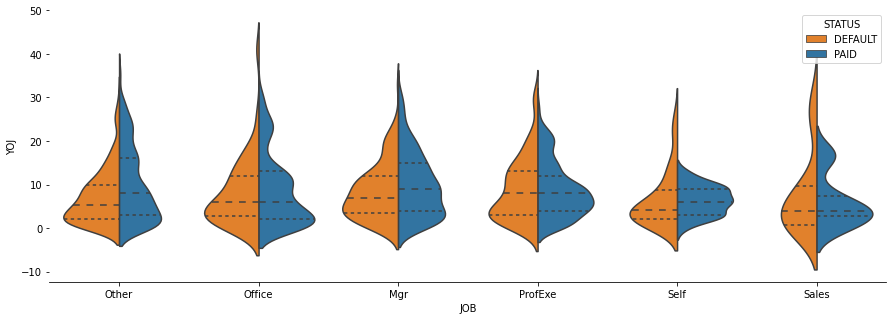

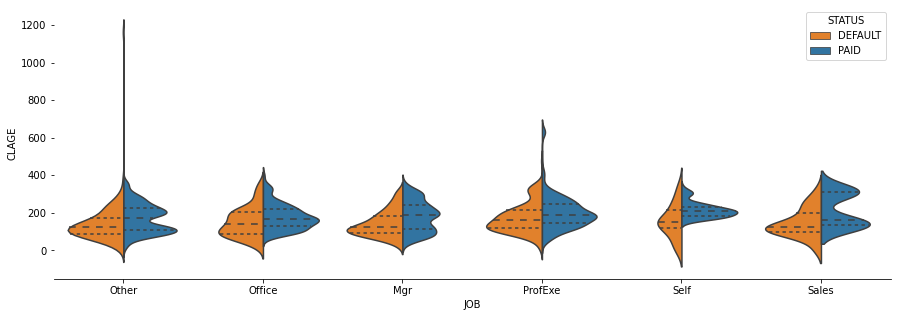

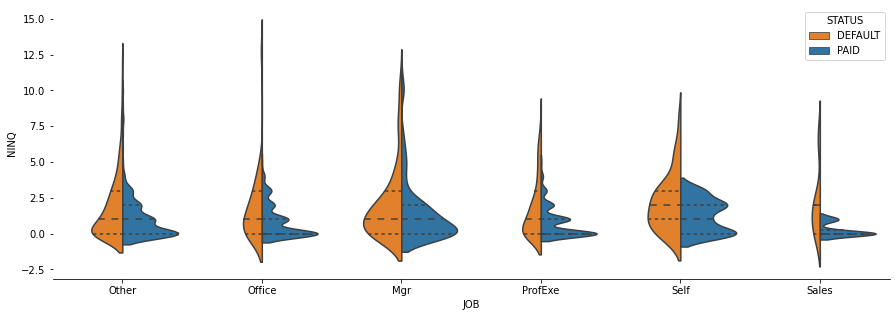

In [14]:
cols=['YOJ', 'CLAGE', 'NINQ']

for col in cols:
    
    plt.figure(figsize=(15,5))

    sns.violinplot(x='JOB', y=col, hue='STATUS',
                   split=True, inner="quart",  palette={'PAID': 'C0', 'DEFAULT':'C1'},
                   data=hmeq)
    
    sns.despine(left=True)

In [15]:
def compute_corr(hmeq,size=10):
    '''Function plots a graphical correlation matrix for each pair of columns in the dataframe.

    Input:
        df: pandas DataFrame
        size: vertical and horizontal size of the plot'''
    import scipy
    import scipy.cluster.hierarchy as sch
    
    corr = hmeq.corr()
    
    # Clustering
    d = sch.distance.pdist(corr)   # vector of ('55' choose 2) pairwise distances
    L = sch.linkage(d, method='complete')
    ind = sch.fcluster(L, 0.5*d.max(), 'distance')
    columns = [hmeq.select_dtypes(include=[np.number]).columns.tolist()[i] for i in list((np.argsort(ind)))]
    
    # Reordered df upon custering results
    hmeq = hmeq.reindex(columns, axis=1)
    
    # Recompute correlation matrix w/ clustering
    corr = hmeq.corr()
    #corr.dropna(axis=0, how='all', inplace=True)
    #corr.dropna(axis=1, how='all', inplace=True)
    #corr.fillna(0, inplace=True)
    
    #fig, ax = plt.subplots(figsize=(size, size))
    #img = ax.matshow(corr)
    #plt.xticks(range(len(corr.columns)), corr.columns, rotation=45);
    #plt.yticks(range(len(corr.columns)), corr.columns);
    #fig.colorbar(img)
    
    return corr

In [16]:
%%opts HeatMap [tools=['hover'] colorbar=True width=500  height=500 toolbar='above', xrotation=45, yrotation=45]

corr=compute_corr(hmeq)
corr=corr.stack(level=0).to_frame('value').reset_index()
hv.HeatMap(corr).options(cmap='Viridis')

:HeatMap   [level_0,level_1]   (value)

# 3.1 Choosing Classifier

The exploratory analysis described above provides good insights on the dataset and higlights the most promising variables with good discrimination power to identify loans resulting in DEFAULT. In this section I develop and investigate supervided machine learning classifiers to predict the outcome of loans. Given the large amount of algorithms available in literature, I begin from the simple methods, such as logistc regression, and gradually increase the model complexity up to randomized trees techniques. Finally I compare the performance of each model and discuss the most appropriate for this loan classification task. In this section, the following models are developed:

1. Logistics Classifier
2. Supporting Vector Classifier
3. Gradient Boosting
4. Bagging - Random Tree
5. Extra Tree


## 3.2 Feature Labels

In [17]:
df = pd.read_csv(hmeq_csv)
df = pd.get_dummies(df, columns=['REASON','JOB'])

df.fillna(df.mean(), inplace=True)


df.head()

,BAD,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,REASON_DebtCon,REASON_HomeImp,JOB_Mgr,JOB_Office,JOB_Other,JOB_ProfExe,JOB_Sales,JOB_Self
0,1,1100,25860.0000,39025.000000,10.500000,0.00000,0.000000,94.366667,1.000000,9.000000,33.779915,0,1,0,0,1,0,0,0
1,1,1300,70053.0000,68400.000000,7.000000,0.00000,2.000000,121.833333,0.000000,14.000000,33.779915,0,1,0,0,1,0,0,0
2,1,1500,13500.0000,16700.000000,4.000000,0.00000,0.000000,149.466667,1.000000,10.000000,33.779915,0,1,0,0,1,0,0,0
3,1,1500,73760.8172,101776.048741,8.922268,0.25457,0.449442,179.766275,1.186055,21.296096,33.779915,0,0,0,0,0,0,0,0
4,0,1700,97800.0000,112000.000000,3.000000,0.00000,0.000000,93.333333,0.000000,14.000000,33.779915,0,1,0,1,0,0,0,0


In [18]:
y = df['BAD']
X = df.drop(['BAD'], axis=1)

In [19]:
def cross_validate_model(model, X, y, 
                         scoring=['f1', 'precision', 'recall', 'roc_auc'], 
                         cv=10, n_jobs=-1, verbose=True):
    
    scores = cross_validate(model, 
                        X, y, 
                        scoring=scoring,
                        cv=cv, n_jobs=n_jobs, 
                        verbose=verbose,
                        return_train_score=False)

    #sorted(scores.keys())
    dd={}
    
    for key, val in scores.items():
        if key in ['fit_time', 'score_time']:
            continue
        #print('{:>30}: {:>6.5f} +/- {:.5f}'.format(key, np.mean(val), np.std(val)) )
        name = " ".join(key.split('_')[1:]).capitalize()
        
        dd[name] = {'Value' : np.mean(val), 'Error' : np.std(val)}
        
    return  pd.DataFrame(dd)    
    #print()
    #pprint(scores)
    #print()

In [20]:
def plot_roc(model, X_test ,y_test, n_classes=0):
    
    from sklearn.metrics import roc_curve, auc
    
    """
    Target scores, can either be probability estimates 
    of the positive class, confidence values, or 
    non-thresholded measure of decisions (as returned 
    by “decision_function” on some classifiers).
    """
    try:
        y_score = model.decision_function(X_test)
    except Exception as e:
        y_score = model.predict_proba(X_test)[:,1]
    
    
    fpr, tpr, _ = roc_curve(y_test.ravel(), y_score.ravel())
    roc_auc = auc(fpr, tpr)

    # Compute micro-average ROC curve and ROC area
    #fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
    #roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    #plt.figure()
    lw = 2
    plt.plot(fpr, tpr, color='darkorange',
             lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)

    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    #plt.show()
    
# shuffle and split training and test sets
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.5,
#                                                    random_state=0)


In [21]:
def plot_confusion_matrix(model, X_test ,y_test,
                          classes=[0,1],
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    
    import itertools
    from sklearn.metrics import confusion_matrix
    
    y_pred = model.predict(X_test)
    
    # Compute confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    np.set_printoptions(precision=2)
    
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    #    print("Normalized confusion matrix")
    #else:
    #    print('Confusion matrix, without normalization')

    #print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [22]:
def feature_importance(coef, names, verbose=False, plot=True):
    
    #importances = model.feature_importances_

    
    
    #std = np.std([tree.feature_importances_ for tree in model.estimators_],
    #             axis=0)
    indices = np.argsort(coef)[::-1]
    
    if verbose:
    
        # Print the feature ranking
        print("Feature ranking:")
    
        for f in range(len(names)):
            print("{:>2d}. {:>15}: {:.5f}".format(f + 1, names[indices[f]], coef[indices[f]]))
        
    if plot:
        
        # Plot the feature importances of the forest
        #plt.figure(figsize=(5,10))
        plt.title("Feature importances")
        plt.barh(range(len(names)), coef[indices][::-1], align="center")
        #plt.barh(range(X.shape[1]), importances[indices][::-1],
        #         xerr=std[indices][::-1], align="center")
        plt.yticks(range(len(names)), names[indices][::-1])
        #plt.xlim([-0.001, 1.1])
        #plt.show()

In [23]:
def plot_proba(model, X, y, bins=40, show_class = 1):
    
    from sklearn.calibration import CalibratedClassifierCV
    
    model = CalibratedClassifierCV(model)#, cv='prefit')
    
    model.fit(X, y)
    
    proba=model.predict_proba(X)
    
    if show_class == 0:
        sns.kdeplot(proba[y==0,0], shade=True, color="r", label='True class')
        sns.kdeplot(proba[y==0,1], shade=True, color="b", label='Wrong class')
        plt.title('Classification probability: Class 0')
    elif show_class == 1:
        sns.kdeplot(proba[y==1,1], shade=True, color="r", label='True class')
        sns.kdeplot(proba[y==1,0], shade=True, color="b", label='Wrong class')
        plt.title('Classification probability: Class 1')
    plt.legend()

# 4.1 Logistics Regression

In [24]:
steps1 = [('scaler', StandardScaler(copy=True, with_mean=True, with_std=True)),
         ('model', LogisticRegression(random_state= 11))]

pipe1 = Pipeline(steps1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 11, stratify = y)
pipe1.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('model',
                 LogisticRegression(C=1.0, class_weight=None, dual=False,
                                    fit_intercept=True, intercept_scaling=1,
                                    l1_ratio=None, max_iter=100,
                                    multi_class='auto', n_jobs=None,
                                    penalty='l2', random_state=11,
                                    solver='lbfgs', tol=0.0001, verbose=0,
                                    warm_start=False))],
         verbose=False)

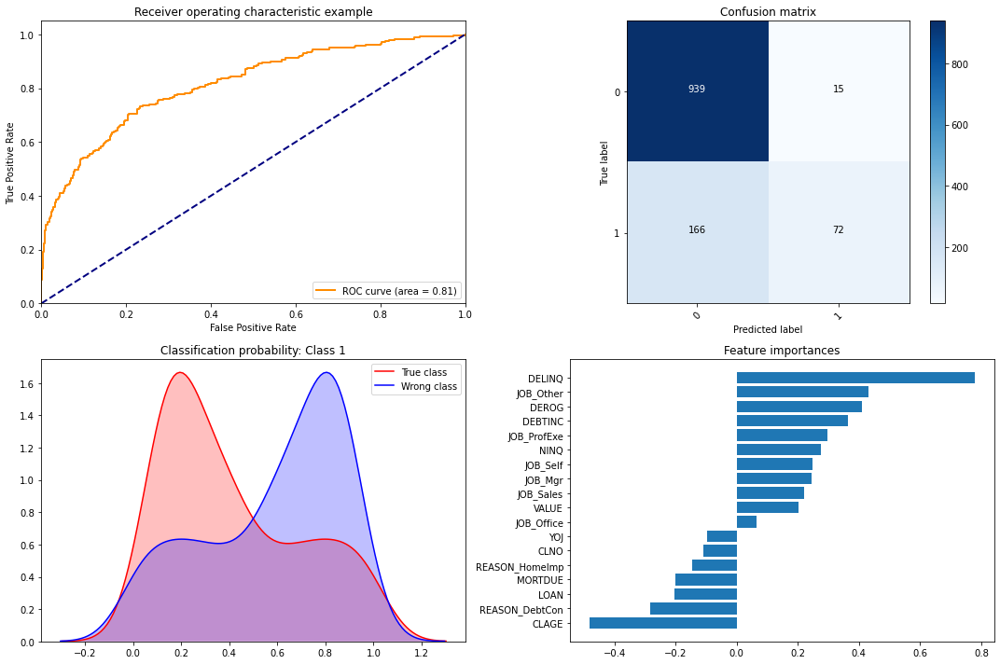

In [25]:
plt.figure(figsize=(15,10))

plt.subplot(221)
plot_roc(pipe1, X_test, y_test)

plt.subplot(222)
plot_confusion_matrix(pipe1, X_test, y_test)

plt.subplot(223)
plot_proba(pipe1, X_test, y_test)

plt.subplot(224)
feature_importance(pipe1.named_steps['model'].coef_[0], X.columns)

plt.tight_layout()

In [26]:
pipe1.named_steps['model'].coef_[0]

array([-0.2 , -0.2 ,  0.2 , -0.1 ,  0.41,  0.78, -0.48,  0.28, -0.11,
        0.36, -0.28, -0.14,  0.25,  0.07,  0.43,  0.3 ,  0.22,  0.25])

In [27]:
logit_xval_res = cross_validate_model(pipe1, X, y, verbose=False)
logit_xval_res.T[['Value','Error']].style.format("{:.2f}")

,Value,Error
F1,0.41,0.06
Precision,0.69,0.13
Recall,0.29,0.05
Roc auc,0.78,0.04


## 4.2 SVC

In [28]:
steps2 = [('scaler', StandardScaler(copy=True, with_mean=True, with_std=True)),
         ('model', SVC(random_state= 11, kernel='linear', probability=True))]

pipe2 = Pipeline(steps2)

pipe2.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('model',
                 SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None,
                     coef0=0.0, decision_function_shape='ovr', degree=3,
                     gamma='scale', kernel='linear', max_iter=-1,
                     probability=True, random_state=11, shrinking=True,
                     tol=0.001, verbose=False))],
         verbose=False)

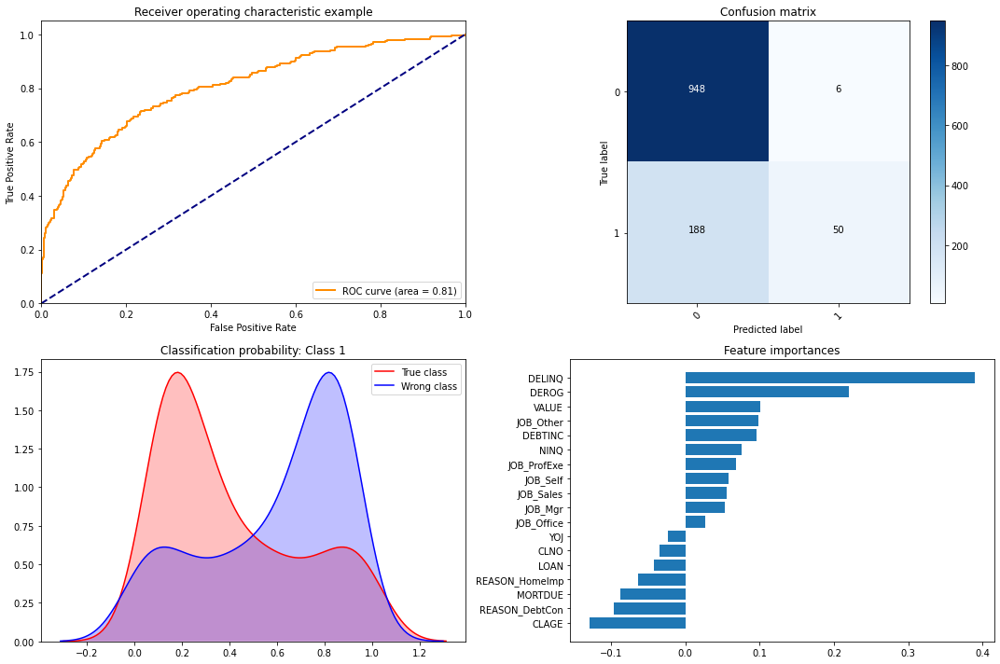

In [29]:
plt.figure(figsize=(15,10))

plt.subplot(221)
plot_roc(pipe2, X_test, y_test)

plt.subplot(222)
plot_confusion_matrix(pipe2, X_test , y_test)

plt.subplot(223)
plot_proba(pipe2, X_test, y_test)

plt.subplot(224)
feature_importance(pipe2.named_steps['model'].coef_[0], X.columns)

plt.tight_layout()

In [30]:
svc_xval_res = cross_validate_model(pipe2, X, y, verbose=False)
svc_xval_res.T[['Value','Error']].style.format("{:.2f}")

,Value,Error
F1,0.34,0.05
Precision,0.77,0.12
Recall,0.22,0.03
Roc auc,0.78,0.04


## 4.3 Gradient Boosting

In [31]:
steps3 = [('scaler', StandardScaler(copy=True, with_mean=True, with_std=True)),
         ('model', GradientBoostingClassifier(n_estimators=250, learning_rate=0.05, random_state=11))]

pipe3 = Pipeline(steps3)

pipe3.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('model',
                 GradientBoostingClassifier(ccp_alpha=0.0,
                                            criterion='friedman_mse', init=None,
                                            learning_rate=0.05, loss='deviance',
                                            max_depth=3, max_features=None,
                                            max_leaf_nodes=None,
                                            min_impurity_decrease=0.0,
                                            min_impurity_split=None,
                                            min_samples_leaf=1,
                                            min_samples_split=2,
                                            min_weight_fraction_leaf=0.0,
                                            n_estimators=250,
                                            n_iter_no_change=None,
               

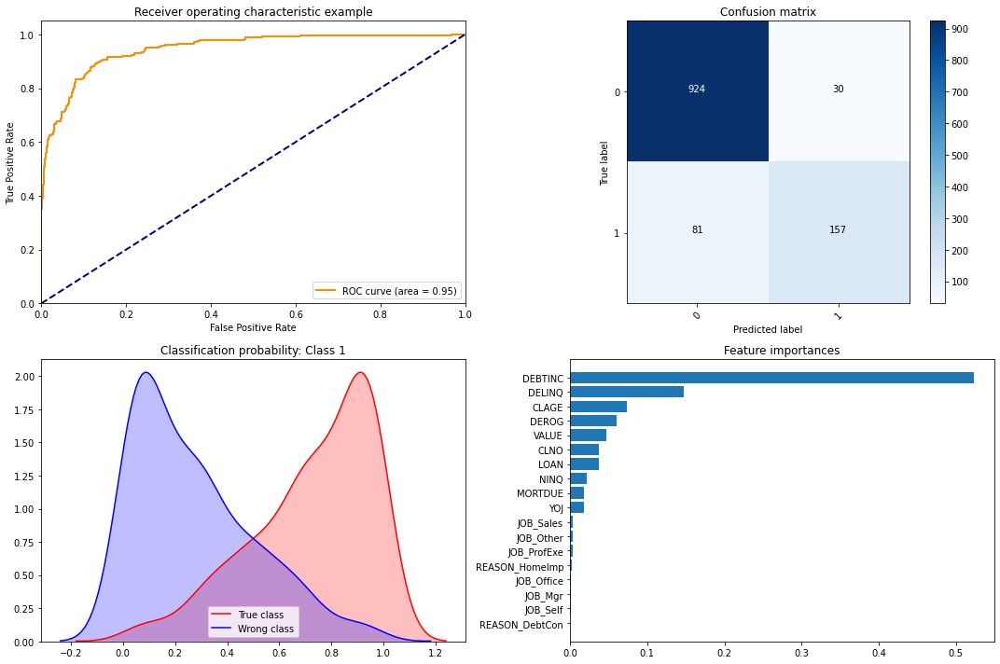

In [32]:
plt.figure(figsize=(15,10))

plt.subplot(221)
plot_roc(pipe3, X_test, y_test)

plt.subplot(222)
plot_confusion_matrix(pipe3, X_test, y_test)

plt.subplot(223)
plot_proba(pipe3, X_test, y_test)

plt.subplot(224)
feature_importance(pipe3.named_steps['model'].feature_importances_, X.columns)

plt.tight_layout()

In [33]:
gbc_xval_res = cross_validate_model(pipe3, X, y, verbose=False)
gbc_xval_res.T[['Value','Error']].style.format("{:.2f}")

,Value,Error
F1,0.49,0.17
Precision,0.53,0.26
Recall,0.52,0.19
Roc auc,0.73,0.19


# 4.4 Random Forest aka Bagging

In [34]:
steps4 = [('scaler', StandardScaler(copy=True, with_mean=True, with_std=True)),
         ('model', RandomForestClassifier(n_estimators=250, n_jobs=-1, random_state= 11))]

pipe4 = Pipeline(steps4)

pipe4.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('model',
                 RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                        class_weight=None, criterion='gini',
                                        max_depth=None, max_features='auto',
                                        max_leaf_nodes=None, max_samples=None,
                                        min_impurity_decrease=0.0,
                                        min_impurity_split=None,
                                        min_samples_leaf=1, min_samples_split=2,
                                        min_weight_fraction_leaf=0.0,
                                        n_estimators=250, n_jobs=-1,
                                        oob_score=False, random_state=11,
                                        verbose=0, warm_start=False))],
         verbose=False)

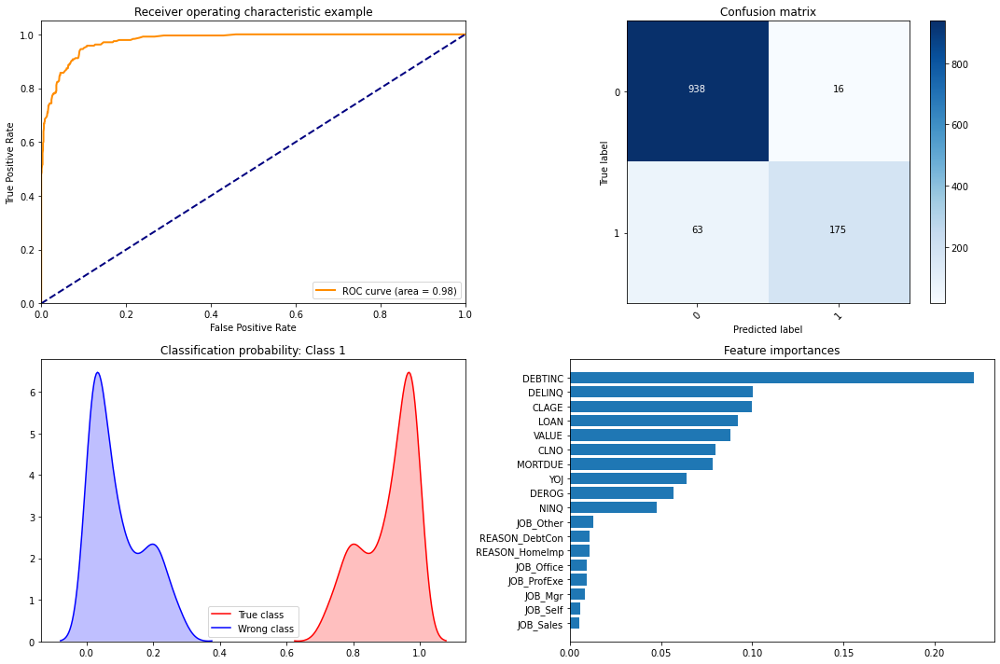

In [35]:
plt.figure(figsize=(15,10))

plt.subplot(221)
plot_roc(pipe4, X_test,y_test)

plt.subplot(222)
plot_confusion_matrix(pipe4, X_test, y_test)

plt.subplot(223)
plot_proba(pipe4, X_test, y_test)

plt.subplot(224)
feature_importance(pipe4.named_steps['model'].feature_importances_, X.columns)

plt.tight_layout()

In [36]:
rfc_xval_res = cross_validate_model(pipe4, X, y, verbose=False)
rfc_xval_res.T[['Value','Error']].style.format("{:.2f}")

,Value,Error
F1,0.65,0.13
Precision,0.75,0.21
Recall,0.64,0.14
Roc auc,0.90,0.05


# 4.5 Extremely Randomised Trees

In extremely randomized trees, randomness goes one step further in the way splits are computed. As in random forests, a random subset of candidate features is used, but instead of looking for the most discriminative thresholds, thresholds are drawn at random for each candidate feature and the best of these randomly-generated thresholds is picked as the splitting rule. This usually allows to reduce the variance of the model a bit more, at the expense of a slightly greater increase in bias

In [37]:
steps5 = [('scaler', StandardScaler(copy=True, with_mean=True, with_std=True)),
         ('model', ExtraTreesClassifier(n_estimators=250, n_jobs=-1, random_state=11, class_weight='balanced'))]

pipe5 = Pipeline(steps5)

pipe5.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('model',
                 ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                                      class_weight='balanced', criterion='gini',
                                      max_depth=None, max_features='auto',
                                      max_leaf_nodes=None, max_samples=None,
                                      min_impurity_decrease=0.0,
                                      min_impurity_split=None,
                                      min_samples_leaf=1, min_samples_split=2,
                                      min_weight_fraction_leaf=0.0,
                                      n_estimators=250, n_jobs=-1,
                                      oob_score=False, random_state=11,
                                      verbose=0, warm_start=False))],
         verbose=False)

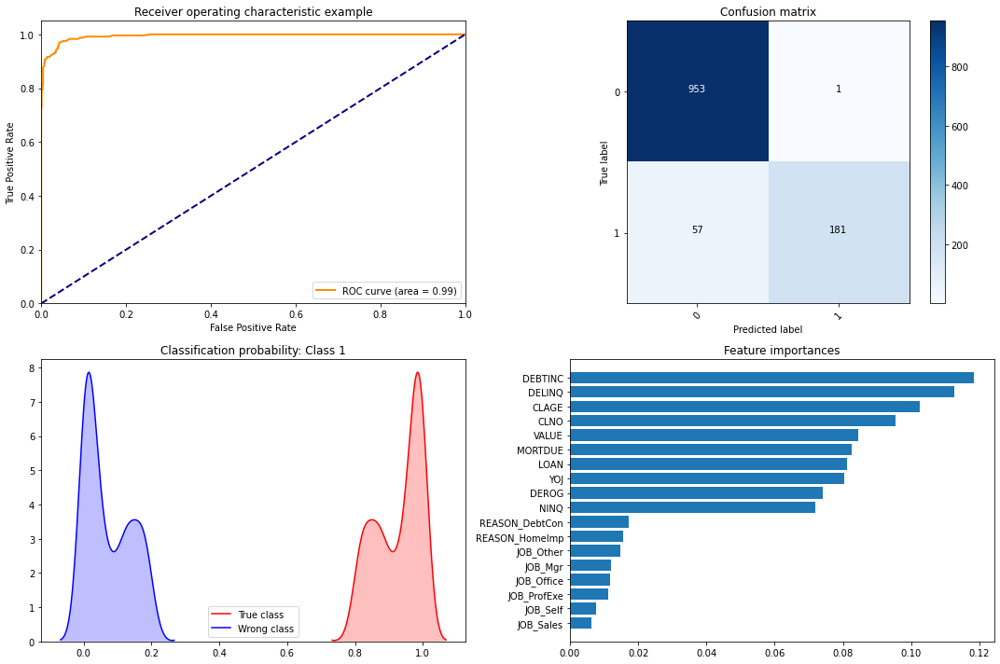

In [38]:
plt.figure(figsize=(15,10))

plt.subplot(221)
plot_roc(pipe5, X_test ,y_test)

plt.subplot(222)
plot_confusion_matrix(pipe5, X_test ,y_test)

plt.subplot(223)
plot_proba(pipe5, X_test, y_test)

plt.subplot(224)
feature_importance(pipe5.named_steps['model'].feature_importances_, X.columns)

plt.tight_layout()

In [39]:
ert_xval_res = cross_validate_model(pipe5, X, y, verbose=False)
ert_xval_res.T[['Value','Error']].style.format("{:.2f}")

,Value,Error
F1,0.75,0.11
Precision,0.88,0.17
Recall,0.68,0.12
Roc auc,0.96,0.05


In [40]:
logit_xval_res[0:1]

,F1,Precision,Recall,Roc auc
Value,0.405639,0.688834,0.290892,0.784804


In [41]:
from collections import OrderedDict

res_comp = OrderedDict([
    ('Logistic Regression'              , logit_xval_res[0:1]),
    ('Supporting Vector Classifier'     , svc_xval_res[0:1]  ),
    ('Random Forest Classifier'         , rfc_xval_res[0:1]  ),
    ('Extermely Random Tree Classifier' , ert_xval_res[0:1]  ),
    ('Gradient Boost Classifier'        , gbc_xval_res[0:1]  ),
])

new_columns = {'level_0' : 'Model'}

pd.concat(res_comp).reset_index().drop('level_1', axis=1).rename(columns=new_columns).set_index('Model').sort_values('F1', ascending=False).style.format("{:.2f}")

,F1,Precision,Recall,Roc auc
Model,,,,
Extermely Random Tree Classifier,0.75,0.88,0.68,0.96
Random Forest Classifier,0.65,0.75,0.64,0.90
Gradient Boost Classifier,0.49,0.53,0.52,0.73
Logistic Regression,0.41,0.69,0.29,0.78
Supporting Vector Classifier,0.34,0.77,0.22,0.78


# Time to predict

In [42]:
hmeq_pred_csv = 'C:/Users/zheng/Desktop/Data Science/Presentations/Mod 8//hmeq_pred.csv'

hmeq_pred = pd.read_csv(hmeq_pred_csv)

In [43]:
hmeq_pred.head()

,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC
0,14200,34558.0,40754,HomeImp,Other,8,0.0,0.0,76.431213,2,11,31.041184
1,14200,NaN,31671,DebtCon,Other,13,NaN,NaN,82.991265,2,8,33.215104
2,14700,30306.0,44195,HomeImp,Other,9,0.0,1.0,87.431226,2,12,29.404935
3,14700,47177.0,68456,HomeImp,ProfExe,3,0.0,0.0,193.685069,2,18,34.542533
4,14700,30210.0,42751,DebtCon,Mgr,17,0.0,0.0,86.641823,0,17,23.397362


In [44]:
df2 = pd.get_dummies(hmeq_pred, columns=['REASON','JOB'])

df2.fillna(0, inplace=True)

In [45]:
df2

,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,REASON_DebtCon,REASON_HomeImp,JOB_Mgr,JOB_Other,JOB_ProfExe
0,14200,34558.0,40754,8,0.0,0.0,76.431213,2,11,31.041184,0,1,0,1,0
1,14200,0.0,31671,13,0.0,0.0,82.991265,2,8,33.215104,1,0,0,1,0
2,14700,30306.0,44195,9,0.0,1.0,87.431226,2,12,29.404935,0,1,0,1,0
3,14700,47177.0,68456,3,0.0,0.0,193.685069,2,18,34.542533,0,1,0,0,1
4,14700,30210.0,42751,17,0.0,0.0,86.641823,0,17,23.397362,1,0,1,0,0


In [46]:
df2['JOB_Office'] = [0,0,0,0,0]
df2['JOB_Self'] = [0,0,0,0,0]
df2['JOB_Sales'] = [0,0,0,0,0]

In [47]:
df2

,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,REASON_DebtCon,REASON_HomeImp,JOB_Mgr,JOB_Other,JOB_ProfExe,JOB_Office,JOB_Self,JOB_Sales
0,14200,34558.0,40754,8,0.0,0.0,76.431213,2,11,31.041184,0,1,0,1,0,0,0,0
1,14200,0.0,31671,13,0.0,0.0,82.991265,2,8,33.215104,1,0,0,1,0,0,0,0
2,14700,30306.0,44195,9,0.0,1.0,87.431226,2,12,29.404935,0,1,0,1,0,0,0,0
3,14700,47177.0,68456,3,0.0,0.0,193.685069,2,18,34.542533,0,1,0,0,1,0,0,0
4,14700,30210.0,42751,17,0.0,0.0,86.641823,0,17,23.397362,1,0,1,0,0,0,0,0


In [48]:
df2['prediction'] = pipe5.predict(df2)

In [49]:
df2[['prediction']]

,prediction
0,0
1,1
2,1
3,0
4,0
